In [1]:
import requests
import pandas as pd
import numpy as np
import json
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
from datetime import timedelta
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from statsmodels.tsa.api import Holt #Time series regression model with inbuilt ARIMA analysis

%matplotlib inline

In [6]:
#Uncomment the 2 lines below

source=requests.get('https://covid.ourworldindata.org/data/owid-covid-data.json').text #https://api.rootnet.in/covid19-in/stats/history :for only india's data 
#source

In [7]:
#Uncomment the 2 lines below

data = json.loads(source)
data

{'AFG': {'continent': 'Asia',
  'location': 'Afghanistan',
  'population': 38928341.0,
  'population_density': 54.422,
  'median_age': 18.6,
  'aged_65_older': 2.581,
  'aged_70_older': 1.337,
  'gdp_per_capita': 1803.987,
  'cardiovasc_death_rate': 597.029,
  'diabetes_prevalence': 9.59,
  'handwashing_facilities': 37.746,
  'hospital_beds_per_thousand': 0.5,
  'life_expectancy': 64.83,
  'data': [{'date': '2019-12-31',
    'total_cases': 0.0,
    'new_cases': 0.0,
    'total_deaths': 0.0,
    'new_deaths': 0.0,
    'total_cases_per_million': 0.0,
    'new_cases_per_million': 0.0,
    'total_deaths_per_million': 0.0,
    'new_deaths_per_million': 0.0},
   {'date': '2020-01-01',
    'total_cases': 0.0,
    'new_cases': 0.0,
    'total_deaths': 0.0,
    'new_deaths': 0.0,
    'total_cases_per_million': 0.0,
    'new_cases_per_million': 0.0,
    'total_deaths_per_million': 0.0,
    'new_deaths_per_million': 0.0,
    'stringency_index': 0.0},
   {'date': '2020-01-02',
    'total_cases': 0

In [77]:
countries=[]
for country_code in data.keys():
    countries.append((data[country_code]['location'],pd.DataFrame(data[country_code]['data'])))

In [78]:
countries

[('Afghanistan',
             date  total_cases  new_cases  total_deaths  new_deaths  \
  0    2019-12-31          0.0        0.0           0.0         0.0   
  1    2020-01-01          0.0        0.0           0.0         0.0   
  2    2020-01-02          0.0        0.0           0.0         0.0   
  3    2020-01-03          0.0        0.0           0.0         0.0   
  4    2020-01-04          0.0        0.0           0.0         0.0   
  ..          ...          ...        ...           ...         ...   
  182  2020-07-10      33908.0      255.0         957.0        20.0   
  183  2020-07-11      34366.0      458.0         994.0        37.0   
  184  2020-07-12      34451.0       85.0        1010.0        16.0   
  185  2020-07-13      34451.0        0.0        1010.0         0.0   
  186  2020-07-14      34455.0        4.0        1012.0         2.0   
  
       total_cases_per_million  new_cases_per_million  total_deaths_per_million  \
  0                      0.000               

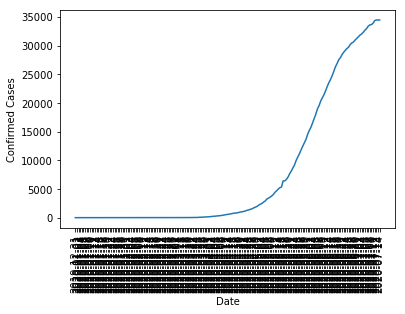

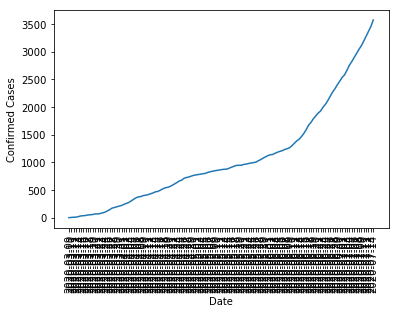

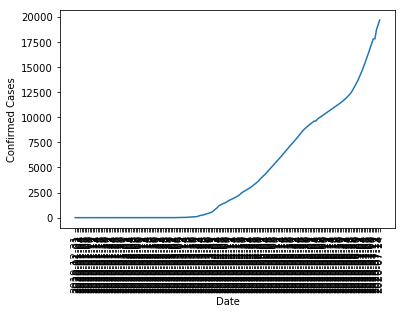

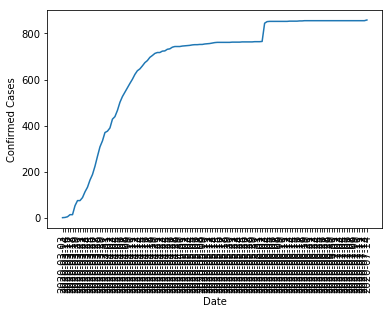

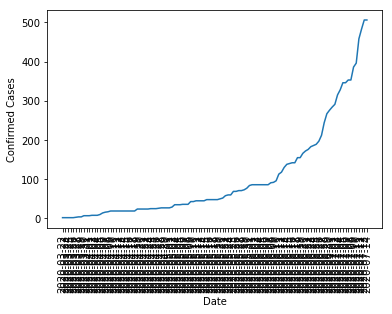

<Figure size 432x288 with 0 Axes>

In [79]:
#First 5 countries alphabetically
for country,df in countries[:5]:
    plt.plot(df['date'],df['total_cases'])
    x=plt.gca().xaxis
    plt.xlabel('Date')
    plt.ylabel('Confirmed Cases')
    for i in x.get_ticklabels():
        i.set_rotation(90)
    plt.show()
    plt.figure()

In [89]:
for country,df in countries:
    if country=="India":
        India=pd.DataFrame(df)
    if country=="China":
        China=pd.DataFrame(df)
    if country=="United States":
        USA=pd.DataFrame(df)
    if country=="United Kingdom":
        UK=pd.DataFrame(df)
    if country=="Spain":
        Spain=pd.DataFrame(df)
    if country=="Italy":
        Italy=pd.DataFrame(df)
    if country=="Russia":
        Russia=pd.DataFrame(df)
India['date']=pd.to_datetime(India['date'])
USA['date']=pd.to_datetime(USA['date'])

### 1.Total confirmed Cases:

#### In India.....

In [90]:
India['Days Since']=India['date']-India['date'].iloc[0]
India['Days Since']   #Days since COVID-19 pandemic began in China

#Test-train split(0.95-0.25)
train_ml = pd.DataFrame({"date":India['date'].iloc[:int(India.shape[0]*(0.95))],"total_cases":India['total_cases'].iloc[:int(India.shape[0]*(0.95)):],"Days Since":India['Days Since'].iloc[:int(India.shape[0]*(0.95)):]})
valid_ml = pd.DataFrame({"date":India['date'].iloc[int(India.shape[0]*(0.95)):],"total_cases":India['total_cases'].iloc[int(India.shape[0]*(0.95)):],"Days Since":India['Days Since'].iloc[int(India.shape[0]*(0.95)):]})
train_ml

,date,total_cases,Days Since
0,2019-12-31,0.0,0 days
1,2020-01-01,0.0,1 days
2,2020-01-02,0.0,2 days
3,2020-01-03,0.0,3 days
4,2020-01-04,0.0,4 days
...,...,...,...
181,2020-06-30,566840.0,182 days
182,2020-07-01,585493.0,183 days
183,2020-07-02,604641.0,184 days
184,2020-07-03,625544.0,185 days


In [91]:
#HOLT Model with inbuilt ARIMA time series analysis model 
holt_forecast = Holt(np.asarray(train_ml['total_cases'])).fit(smoothing_level=1.4,smoothing_slope=0.2)  #Flattening the curve
y_pred = valid_ml.copy()
y_pred['Forecast'] = holt_forecast.forecast(len(valid_ml))
y_pred

C:\Users\Sumukh Raju Bhat\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters.py:731: RuntimeWarning: invalid value encountered in greater_equal
  loc = initial_p >= ub


,date,total_cases,Days Since,Forecast
186,2020-07-05,673165.0,187 days,669092.249434
187,2020-07-06,697413.0,188 days,688626.730081
188,2020-07-07,719665.0,189 days,708161.210728
189,2020-07-08,742417.0,190 days,727695.691375
190,2020-07-09,767296.0,191 days,747230.172023
191,2020-07-10,793802.0,192 days,766764.652670
192,2020-07-11,820916.0,193 days,786299.133317
193,2020-07-12,849553.0,194 days,805833.613964
194,2020-07-13,878254.0,195 days,825368.094611
195,2020-07-14,906752.0,196 days,844902.575258


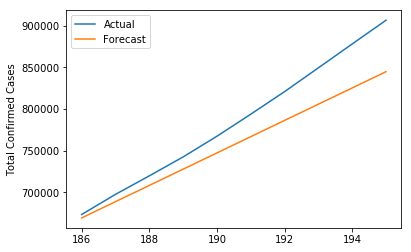

In [103]:
plt.plot(y_pred['total_cases'])
plt.plot(y_pred['Forecast'])
plt.legend(['Actual','Forecast'])
plt.ylabel('Total Confirmed Cases')
plt.show()
    

#### In USA....

In [93]:
USA['Days Since']=USA['date']-USA['date'].iloc[0]
USA['Days Since']   #Days since COVID-19 pandemic began in China

#Test-train split(0.95-0.25)
train_ml_usa = pd.DataFrame({"date":USA['date'].iloc[:int(USA.shape[0]*(0.95))],"total_cases":USA['total_cases'].iloc[:int(USA.shape[0]*(0.95)):],"Days Since":USA['Days Since'].iloc[:int(USA.shape[0]*(0.95)):]})
valid_ml_usa = pd.DataFrame({"date":USA['date'].iloc[int(USA.shape[0]*(0.95)):],"total_cases":USA['total_cases'].iloc[int(USA.shape[0]*(0.95)):],"Days Since":USA['Days Since'].iloc[int(USA.shape[0]*(0.95)):]})
train_ml_usa

,date,total_cases,Days Since
0,2019-12-31,0.0,0 days
1,2020-01-01,0.0,1 days
2,2020-01-02,0.0,2 days
3,2020-01-03,0.0,3 days
4,2020-01-04,0.0,4 days
...,...,...,...
182,2020-06-30,2590552.0,182 days
183,2020-07-01,2634432.0,183 days
184,2020-07-02,2686480.0,184 days
185,2020-07-03,2739879.0,185 days


In [94]:
holt_forecast_usa = Holt(np.asarray(train_ml_usa['total_cases'])).fit(smoothing_level=1.4,smoothing_slope=0.2)  #Flattening the curve
y_pred_usa = valid_ml_usa.copy()
y_pred_usa['Forecast'] = holt_forecast_usa.forecast(len(valid_ml_usa))
y_pred_usa

C:\Users\Sumukh Raju Bhat\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters.py:731: RuntimeWarning: invalid value encountered in greater_equal
  loc = initial_p >= ub


,date,total_cases,Days Since,Forecast
187,2020-07-05,2839542.0,187 days,2.843631e+06
188,2020-07-06,2888635.0,188 days,2.889854e+06
189,2020-07-07,2938625.0,189 days,2.936078e+06
190,2020-07-08,2996098.0,190 days,2.982302e+06
191,2020-07-09,3055004.0,191 days,3.028525e+06
192,2020-07-10,3118008.0,192 days,3.074749e+06
193,2020-07-11,3184633.0,193 days,3.120972e+06
194,2020-07-12,3247684.0,194 days,3.167196e+06
195,2020-07-13,3304942.0,195 days,3.213420e+06
196,2020-07-14,3363056.0,196 days,3.259643e+06


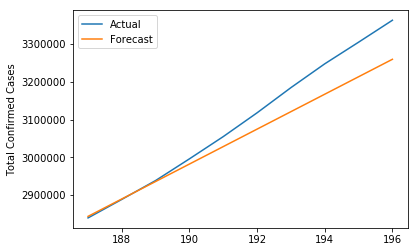

In [104]:
plt.plot(y_pred_usa['total_cases'])
plt.plot(y_pred_usa['Forecast'])
plt.legend(['Actual','Forecast'])
plt.ylabel('Total Confirmed Cases')
plt.show()

### 2.New cases:

#### In India....

In [99]:
#Test-train split(0.95-0.25)
train_ml_2 = pd.DataFrame({"date":India['date'].iloc[:int(India.shape[0]*(0.95))],"new_cases":India['new_cases'].iloc[:int(India.shape[0]*(0.95)):],"Days Since":India['Days Since'].iloc[:int(India.shape[0]*(0.95)):]})
valid_ml_2 = pd.DataFrame({"date":India['date'].iloc[int(India.shape[0]*(0.95)):],"new_cases":India['new_cases'].iloc[int(India.shape[0]*(0.95)):],"Days Since":India['Days Since'].iloc[int(India.shape[0]*(0.95)):]})
train_ml_2

,date,new_cases,Days Since
0,2019-12-31,0.0,0 days
1,2020-01-01,0.0,1 days
2,2020-01-02,0.0,2 days
3,2020-01-03,0.0,3 days
4,2020-01-04,0.0,4 days
...,...,...,...
181,2020-06-30,18522.0,182 days
182,2020-07-01,18653.0,183 days
183,2020-07-02,19148.0,184 days
184,2020-07-03,20903.0,185 days


In [101]:
holt_forecast_2 = Holt(np.asarray(train_ml_2['new_cases'])).fit(smoothing_level=1.4,smoothing_slope=0.2)  #Flattening the curve
y_pred_2 = valid_ml_2.copy()
y_pred_2['Forecast'] = holt_forecast_2.forecast(len(valid_ml_2))
y_pred_2

,date,new_cases,Days Since,Forecast
186,2020-07-05,24850.0,187 days,23884.171401
187,2020-07-06,24248.0,188 days,24754.109552
188,2020-07-07,22252.0,189 days,25624.047703
189,2020-07-08,22752.0,190 days,26493.985854
190,2020-07-09,24879.0,191 days,27363.924005
191,2020-07-10,26506.0,192 days,28233.862156
192,2020-07-11,27114.0,193 days,29103.800306
193,2020-07-12,28637.0,194 days,29973.738457
194,2020-07-13,28701.0,195 days,30843.676608
195,2020-07-14,28498.0,196 days,31713.614759


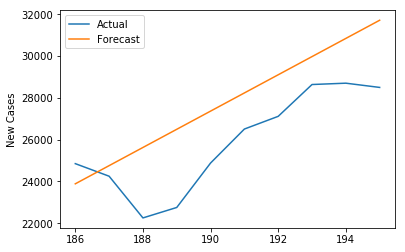

In [106]:
plt.plot(y_pred_2['new_cases'])
plt.plot(y_pred_2['Forecast'])
plt.legend(['Actual','Forecast'])
plt.ylabel('New Cases')
plt.show()
    

#### In USA....

In [109]:
#Test-train split(0.95-0.25)
train_ml_usa_2 = pd.DataFrame({"date":USA['date'].iloc[:int(USA.shape[0]*(0.95))],"new_cases":USA['new_cases'].iloc[:int(USA.shape[0]*(0.95)):],"Days Since":USA['Days Since'].iloc[:int(USA.shape[0]*(0.95)):]})
valid_ml_usa_2 = pd.DataFrame({"date":USA['date'].iloc[int(USA.shape[0]*(0.95)):],"new_cases":USA['new_cases'].iloc[int(USA.shape[0]*(0.95)):],"Days Since":USA['Days Since'].iloc[int(USA.shape[0]*(0.95)):]})
train_ml_usa_2

,date,new_cases,Days Since
0,2019-12-31,0.0,0 days
1,2020-01-01,0.0,1 days
2,2020-01-02,0.0,2 days
3,2020-01-03,0.0,3 days
4,2020-01-04,0.0,4 days
...,...,...,...
182,2020-06-30,41556.0,182 days
183,2020-07-01,43880.0,183 days
184,2020-07-02,52048.0,184 days
185,2020-07-03,53399.0,185 days


In [110]:
holt_forecast_usa_2 = Holt(np.asarray(train_ml_usa_2['new_cases'])).fit(smoothing_level=1.4,smoothing_slope=0.2)  #Flattening the curve
y_pred_usa_2 = valid_ml_usa_2.copy()
y_pred_usa_2['Forecast'] = holt_forecast_usa_2.forecast(len(valid_ml_usa_2))
y_pred_usa_2

C:\Users\Sumukh Raju Bhat\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters.py:731: RuntimeWarning: invalid value encountered in greater_equal
  loc = initial_p >= ub


,date,new_cases,Days Since,Forecast
187,2020-07-05,45221.0,187 days,57025.452130
188,2020-07-06,49093.0,188 days,59185.820986
189,2020-07-07,49990.0,189 days,61346.189841
190,2020-07-08,57473.0,190 days,63506.558697
191,2020-07-09,58906.0,191 days,65666.927552
192,2020-07-10,63004.0,192 days,67827.296408
193,2020-07-11,66625.0,193 days,69987.665263
194,2020-07-12,63051.0,194 days,72148.034118
195,2020-07-13,57258.0,195 days,74308.402974
196,2020-07-14,58114.0,196 days,76468.771829


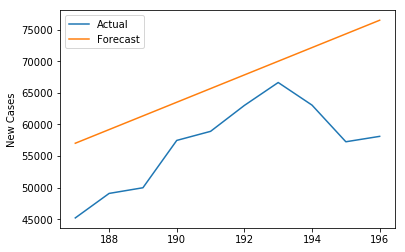

In [111]:
plt.plot(y_pred_usa_2['new_cases'])
plt.plot(y_pred_usa_2['Forecast'])
plt.legend(['Actual','Forecast'])
plt.ylabel('New Cases')
plt.show()